In [2]:
import os
import pandas as pd
import numpy as np
from scipy import ndimage
import cv2
from gc import collect
import random
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import seaborn
import cv2
from sklearn.utils import shuffle

In [3]:
def get_labels(label_file):
    """lê a tabela com as informações dos pacientes e retorna uma matriz com o ID e as labels"""
    labels = pd.read_csv(label_file)
    cancer_labels = dict()

    for p in labels.index:
        cancer_labels[labels['PatientID'][p]] = [int(labels['Normal'][p]), int(labels['Actionable'][p]), int(labels['Benign'][p]), int(labels['Cancer'][p])]

    return cancer_labels

In [4]:
def read_dataset(features_pathfile, csv_labels_pathfile, images_per_class):
  """
      A partir de um conjunto de numpy arrays salvos e do csv com as 
  labels, será montado o conjunto de dados para uso nos algoritmos com um 
  número máximo de features por classe. 
  ********(função com possível modificação no futuro)********
  """
  examples_per_class = [0, 0, 0, 0]

  pacients_ID = os.listdir(features_pathfile)
  labels_list = get_labels(csv_labels_pathfile)
  X, y = [], []
  for ID in pacients_ID:
    try:
        label = labels_list[ID[:-4]]
    except:
        continue
    if images_per_class != -1:
        if examples_per_class[np.argmax(label)] > images_per_class:
            continue

        examples_per_class[np.argmax(label)] += 1
        X.append(np.load(features_pathfile + '/' + ID))

        if len(y) == images_per_class*4:
            break
    else:
        X.append(np.load(features_pathfile + '/' + ID))

    y.append(label)

  return np.array(X), np.array(y)

In [5]:
def separate_slices(img):
  slices = []

  for i in range(img.shape[-2]):
    slices.append(img[:,:,i])
  
  slices.append(np.mean(img, axis=-2))

  return slices

In [6]:
def multiply_labels(labels, n_slices):
  new_labels = []
  for l in labels:
    for _ in range(n_slices+1):
      new_labels.append(l)

  return np.array(new_labels)

In [7]:
def create_2D_dataset(X, y):
  X, y = shuffle(X, y, random_state=437843)

  length = len(X)
  slices = X.shape[-2]

  X_train3D, y_train3D = X[0:int(length*0.6)], y[0:int(length*0.6)]
  X_val3D, y_val3D = X[int(length*0.6):int(length*0.8)], y[int(length*0.6):int(length*0.8)]
  X_test3D, y_test3D = X[int(length*0.8):], y[int(length*0.8):]

  X_train2D, X_val2D, X_test2D = [], [], []
  y_train2D, y_val2D, y_test2D = [], [], []


  for x in X_train3D:
    X_train2D += separate_slices(x)
  y_train2D = multiply_labels(y_train3D, slices)

  for x in X_val3D:
    X_val2D += separate_slices(x)
  y_val2D = multiply_labels(y_val3D, slices)

  for x in X_test3D:
    X_test2D += separate_slices(x)
  y_test2D = multiply_labels(y_test3D, slices)

  return np.array(X_train2D), np.array(X_val2D), \
         np.array(X_test2D), np.array(y_train2D), \
         np.array(y_val2D), np.array(y_test2D)

In [8]:
def data_augmentation(X, y):
    new_images = []
    new_labels = []
    for x, label in zip(X, y):
        x = np.squeeze(x, -1)
        new_images.append(np.expand_dims(x, -1).astype('float16'))
        
        new_images.append(ndimage.rotate(np.expand_dims(x, -1).astype('float32'), angle=10, axes=(1, 0), reshape=False).astype('float16'))
        new_images.append(ndimage.rotate(np.expand_dims(x, -1).astype('float32'), angle=-10, axes=(1, 0), reshape=False).astype('float16'))
        
        x = cv2.flip(x, 1)
        new_images.append(np.expand_dims(x, -1).astype('float16'))
        new_images.append(ndimage.rotate(np.expand_dims(x, -1).astype('float32'), angle=10, axes=(1, 0), reshape=False).astype('float16'))
        new_images.append(ndimage.rotate(np.expand_dims(x, -1).astype('float32'), angle=-10, axes=(1, 0), reshape=False).astype('float16'))
        
        for _ in range(6):
            new_labels.append(label)
        
    return np.array(new_images), np.array(new_labels)

In [9]:
X, y = read_dataset('/kaggle/input/240x320x10', '/kaggle/input/usar-esses-aqui/labels.csv', -1)

In [10]:
X_train, X_val, X_test, y_train, y_val, y_test = create_2D_dataset(X, y)

In [11]:
X_train, y_train = data_augmentation(X_train, y_train)
X_train.shape, y_train.shape

((8778, 240, 320, 1), (8778, 4))

In [12]:
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

Number of devices: 1


In [13]:
#callback para salvar o modelo posteriormente
checkpoint_callback_accuracy = tf.keras.callbacks.ModelCheckpoint(filepath='./models/accuracy/',
                                                                  save_weights_only=True,
                                                                  monitor='val_categorical_accuracy',
                                                                  mode='max',
                                                                  save_best_only=True)

checkpoint_callback_precision = tf.keras.callbacks.ModelCheckpoint(filepath='./models/precision/',
                                                                   save_weights_only=True,
                                                                   monitor='val_precision',
                                                                   mode='max',
                                                                   save_best_only=True)

checkpoint_callback_auc1 = tf.keras.callbacks.ModelCheckpoint(filepath='./models/auc1/',
                                                             save_weights_only=True,
                                                             monitor='val_auc',
                                                             mode='max',
                                                             save_best_only=True)

checkpoint_callback_auc2 = tf.keras.callbacks.ModelCheckpoint(filepath='./models/auc2/',
                                                             save_weights_only=True,
                                                             monitor='val_auc_1',
                                                             mode='max',
                                                             save_best_only=True)

checkpoint_loss = tf.keras.callbacks.ModelCheckpoint(filepath='.models/models/loss/',
                                                     save_weights_only=True,
                                                     monitor='val_loss',
                                                     mode='min',
                                                     save_best_only=True)

In [14]:
vgg19 = tf.keras.Sequential([tf.keras.layers.Conv2D(input_shape=(240, 320, 1), filters=64, kernel_size=(6,8), use_bias=True, padding='same', activation="relu"),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                             
                             tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                             
                             tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 4), use_bias=True,padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=256, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu",kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                             
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.MaxPool2D(pool_size=(2,2)),
                             
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Conv2D(filters=512, kernel_size=(3, 4), use_bias=True, padding='same', 
                                                    activation="relu", kernel_initializer=tf.keras.initializers.HeNormal()),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.MaxPool2D(pool_size=(3, 4)),
                             
                             tf.keras.layers.Flatten(),
                             tf.keras.layers.Dense(4096, activation='selu'),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Dropout(0.5),
                             tf.keras.layers.Dense(4096, activation='selu'),
                             tf.keras.layers.BatchNormalization(),
                             tf.keras.layers.Dropout(0.5),
                             tf.keras.layers.Dense(4, activation='softmax')])

In [15]:
vgg19.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 240, 320, 64)      3136      
                                                                 
 batch_normalization (BatchN  (None, 240, 320, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 240, 320, 64)      49216     
                                                                 
 batch_normalization_1 (Batc  (None, 240, 320, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 120, 160, 64)     0         
 )                                                               
                                                        

In [16]:
vgg19.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0015), 
              loss='categorical_crossentropy', 
              metrics=[tf.keras.metrics.CategoricalAccuracy(), 
                       tf.keras.metrics.Precision(),
                       tf.keras.metrics.AUC(multi_label=True, num_labels=4, label_weights=[1/0.3381294964028777, 1/0.2517985611510791, 1/0.2302158273381295, 1/0.17985611510791366]),
                       tf.keras.metrics.AUC(multi_label=True, num_labels=4)])

vgg19.fit(X_train,
          y_train,
          batch_size=16,
          epochs=30,
          shuffle=True,
          validation_data=(X_val, y_val),
          callbacks=[checkpoint_callback_accuracy, 
                     checkpoint_callback_precision, 
                     checkpoint_callback_auc1, 
                     checkpoint_callback_auc2,
                     checkpoint_loss],
          workers=1,
          use_multiprocessing=True)

Epoch 1/30
549/549 [==============================] - 331s 564ms/step - loss: 2.5625 - categorical_accuracy: 0.3733 - precision: 0.3812 - auc: 0.6079 - auc_1: 0.6038 - val_loss: 4.1295 - val_categorical_accuracy: 0.3037 - val_precision: 0.2915 - val_auc: 0.5900 - val_auc_1: 0.5724
Epoch 2/30
549/549 [==============================] - 316s 576ms/step - loss: 2.0141 - categorical_accuracy: 0.4379 - precision: 0.4512 - auc: 0.6766 - auc_1: 0.6716 - val_loss: 3.7930 - val_categorical_accuracy: 0.3058 - val_precision: 0.3141 - val_auc: 0.6381 - val_auc_1: 0.6200
Epoch 3/30
549/549 [==============================] - 297s 540ms/step - loss: 1.6583 - categorical_accuracy: 0.5648 - precision: 0.5770 - auc: 0.7912 - auc_1: 0.7855 - val_loss: 7.0548 - val_categorical_accuracy: 0.3182 - val_precision: 0.3182 - val_auc: 0.4947 - val_auc_1: 0.4984
Epoch 4/30
549/549 [==============================] - 297s 540ms/step - loss: 1.1247 - categorical_accuracy: 0.6965 - precision: 0.7073 - auc: 0.8875 - au

16/16 [==============================] - 10s 350ms/step - loss: 18.9400 - categorical_accuracy: 0.3091 - precision: 0.3103 - auc: 0.4921 - auc_1: 0.4994


[18.94001007080078,
 0.30909091234207153,
 0.3103448152542114,
 0.4921439290046692,
 0.4994044303894043]

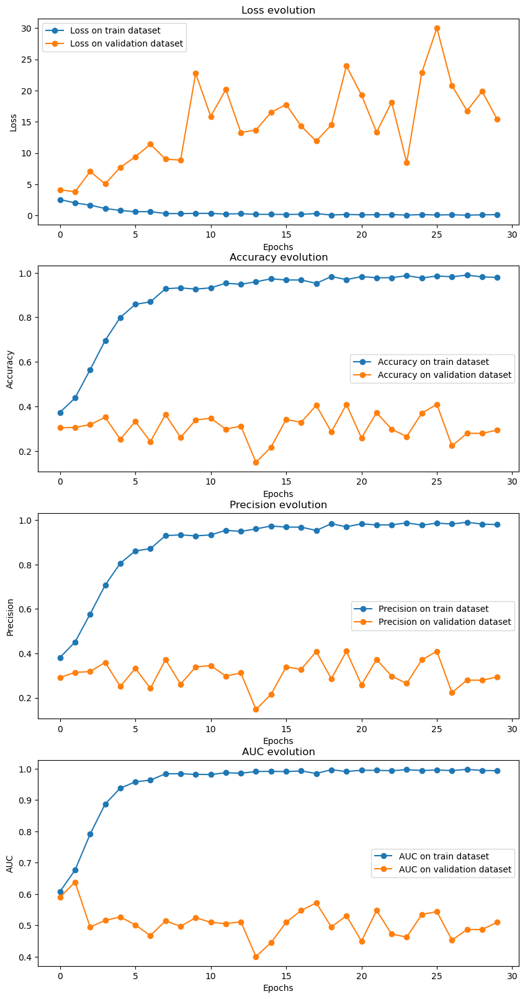

In [17]:
keys = list(vgg19.history.history.keys())

plt.figure(figsize=(10, 25))

plt.subplot(5, 1, 1)
plt.plot(vgg19.history.history[keys[0]], label='Training', marker='o')
plt.plot(vgg19.history.history[keys[5]], label='Validation', marker='o')
plt.title('Loss evolution')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Loss on train dataset', 'Loss on validation dataset'])

plt.subplot(5, 1, 2)
plt.plot(vgg19.history.history[keys[1]], label='Training', marker='o')
plt.plot(vgg19.history.history[keys[6]], label='Validation', marker='o')
plt.title('Accuracy evolution')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Accuracy on train dataset', 'Accuracy on validation dataset'])

plt.subplot(5, 1, 3)
plt.plot(vgg19.history.history[keys[2]], label='Training', marker='o')
plt.plot(vgg19.history.history[keys[7]], label='Validation', marker='o')
plt.title('Precision evolution')
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.legend(['Precision on train dataset', 'Precision on validation dataset'])

plt.subplot(5, 1, 4)
plt.plot(vgg19.history.history[keys[3]], label='Training', marker='o')
plt.plot(vgg19.history.history[keys[8]], label='Validation', marker='o')
plt.title('AUC evolution')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend(['AUC on train dataset', 'AUC on validation dataset'])

vgg19.evaluate(X_test, y_test)

495/495 [==============================] - 11s 22ms/step - loss: 18.9400 - categorical_accuracy: 0.3091 - precision: 0.3103 - auc: 0.4921 - auc_1: 0.4994


<AxesSubplot:>

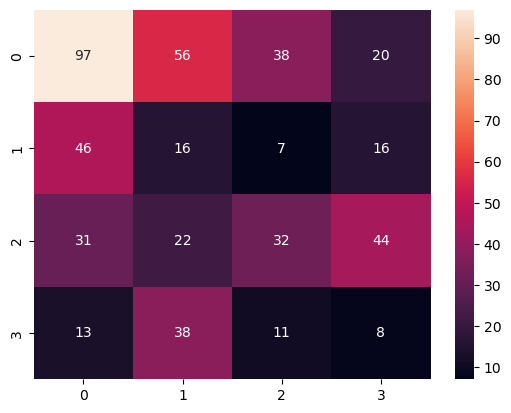

In [18]:
results_from_nn_test = []

for x in X_test:
  results_from_nn_test.append(vgg19.predict(np.array([x]), verbose=0))

vgg19.evaluate(X_test, y_test, batch_size=1)

confusion_matrix_test = [[0 for _ in range(4)] for _ in range(4)]

for pred, res in zip(results_from_nn_test, y_test):
  pred = np.argmax(pred[0])
  res = np.argmax(res)
  confusion_matrix_test[pred][res] += 1

seaborn.heatmap(confusion_matrix_test, annot=True)

495/495 [==============================] - 11s 23ms/step - loss: 20.4943 - categorical_accuracy: 0.3657 - precision: 0.3657 - auc: 0.5138 - auc_1: 0.5227


<AxesSubplot:>

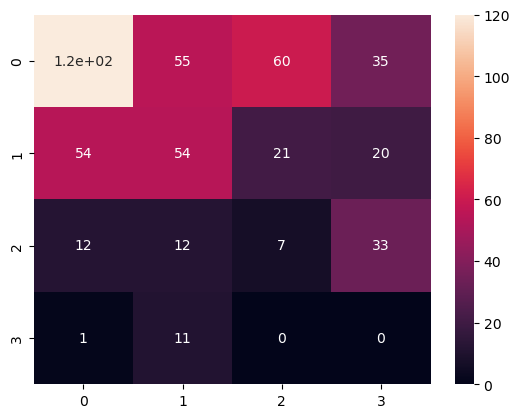

In [19]:
vgg19.load_weights('./models/accuracy/')

results_from_nn_test = []

for x in X_test:
  results_from_nn_test.append(vgg19.predict(np.array([x]), verbose=0))

vgg19.evaluate(X_test, y_test, batch_size=1)

confusion_matrix_test = [[0 for _ in range(4)] for _ in range(4)]

for pred, res in zip(results_from_nn_test, y_test):
  pred = np.argmax(pred[0])
  res = np.argmax(res)
  confusion_matrix_test[pred][res] += 1

seaborn.heatmap(confusion_matrix_test, annot=True)

495/495 [==============================] - 11s 23ms/step - loss: 20.4943 - categorical_accuracy: 0.3657 - precision: 0.3657 - auc: 0.5138 - auc_1: 0.5227


<AxesSubplot:>

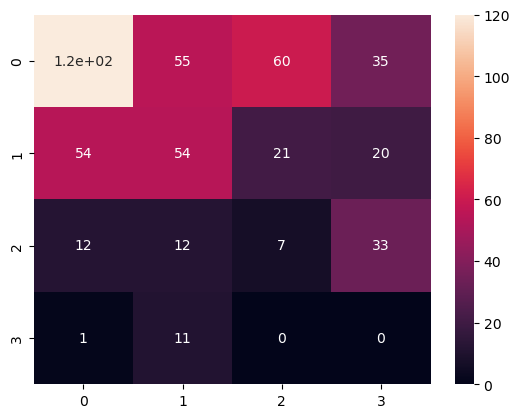

In [20]:
vgg19.load_weights('./models/precision/')

results_from_nn_test = []

for x in X_test:
  results_from_nn_test.append(vgg19.predict(np.array([x]), verbose=0))

vgg19.evaluate(X_test, y_test, batch_size=1)

confusion_matrix_test = [[0 for _ in range(4)] for _ in range(4)]

for pred, res in zip(results_from_nn_test, y_test):
  pred = np.argmax(pred[0])
  res = np.argmax(res)
  confusion_matrix_test[pred][res] += 1

seaborn.heatmap(confusion_matrix_test, annot=True)

495/495 [==============================] - 11s 23ms/step - loss: 4.3070 - categorical_accuracy: 0.1960 - precision: 0.1878 - auc: 0.4909 - auc_1: 0.4888


<AxesSubplot:>

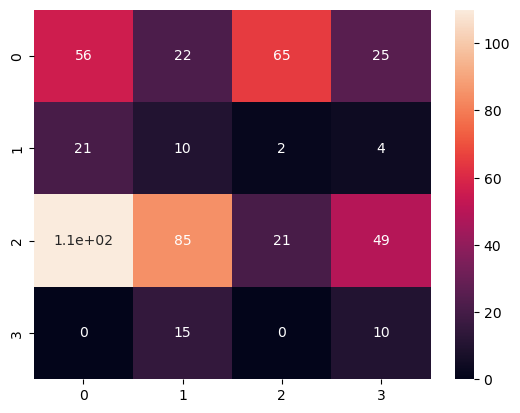

In [21]:
vgg19.load_weights('./models/auc1/')

results_from_nn_test = []

for x in X_test:
  results_from_nn_test.append(vgg19.predict(np.array([x]), verbose=0))

vgg19.evaluate(X_test, y_test, batch_size=1)

confusion_matrix_test = [[0 for _ in range(4)] for _ in range(4)]

for pred, res in zip(results_from_nn_test, y_test):
  pred = np.argmax(pred[0])
  res = np.argmax(res)
  confusion_matrix_test[pred][res] += 1

seaborn.heatmap(confusion_matrix_test, annot=True)

495/495 [==============================] - 11s 23ms/step - loss: 4.3070 - categorical_accuracy: 0.1960 - precision: 0.1878 - auc: 0.4909 - auc_1: 0.4888


<AxesSubplot:>

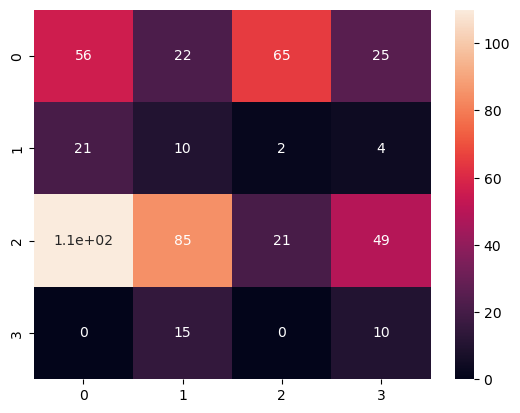

In [22]:
vgg19.load_weights('./models/auc2/')

results_from_nn_test = []

for x in X_test:
  results_from_nn_test.append(vgg19.predict(np.array([x]), verbose=0))

vgg19.evaluate(X_test, y_test, batch_size=1)

confusion_matrix_test = [[0 for _ in range(4)] for _ in range(4)]

for pred, res in zip(results_from_nn_test, y_test):
  pred = np.argmax(pred[0])
  res = np.argmax(res)
  confusion_matrix_test[pred][res] += 1

seaborn.heatmap(confusion_matrix_test, annot=True)

495/495 [==============================] - 11s 23ms/step - loss: 4.3070 - categorical_accuracy: 0.1960 - precision: 0.1878 - auc: 0.4909 - auc_1: 0.4888


<AxesSubplot:>

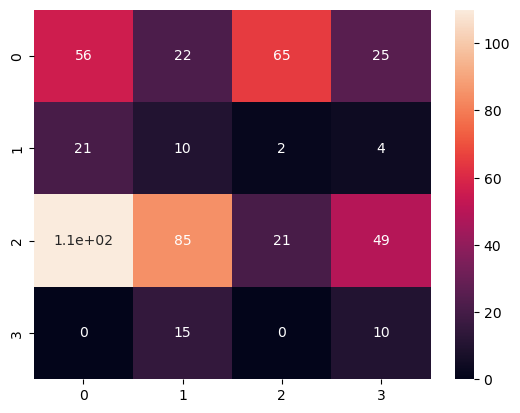

In [23]:
vgg19.load_weights('.models/models/loss/')

results_from_nn_test = []

for x in X_test:
  results_from_nn_test.append(vgg19.predict(np.array([x]), verbose=0))

vgg19.evaluate(X_test, y_test, batch_size=1)

confusion_matrix_test = [[0 for _ in range(4)] for _ in range(4)]

for pred, res in zip(results_from_nn_test, y_test):
  pred = np.argmax(pred[0])
  res = np.argmax(res)
  confusion_matrix_test[pred][res] += 1

seaborn.heatmap(confusion_matrix_test, annot=True)

In [58]:
def predict(images, label, model):
  print("Class label is: ", end='')
  if np.argmax(label) == 0:
    print("Normal")
  elif np.argmax(label) == 1:
    print("Actionable")
  elif np.argmax(label) == 2:
    print("Benign")
  else:
    print("Cancer")

  predicts = model.predict(images)

  plt.figure(figsize=(20, 60))
  for j, img in enumerate(images):
    plt.subplot(11,1, j+1)
    plt.title(str(predicts[j]))
    plt.imshow(img)
    
    
  print(np.sum(predicts, axis=0))
  predicts = np.argmax(np.sum(predicts, axis=0))

  print("Algorithm predict: ", end='')
  if predicts == 0:
    print("Normal")
  elif predicts == 1:
    print("Actionable")
  elif predicts == 2:
    print("Benign")
  else:
    print("Cancer")

In [25]:
vgg19.load_weights('./models/accuracy/')

In [66]:
i = 0

Class label is: Cancer
1/1 [==============================] - 0s 31ms/step
[9.9986625e-12 9.9483610e-30 1.1000000e+01 5.2972005e-09]
Algorithm predict: Benign


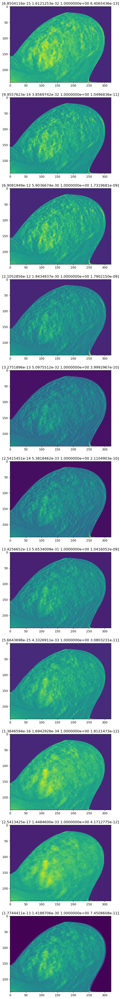

In [67]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Normal
1/1 [==============================] - 0s 31ms/step
[8.0912672e-12 1.1000000e+01 3.6275618e-25 2.8961321e-23]
Algorithm predict: Actionable


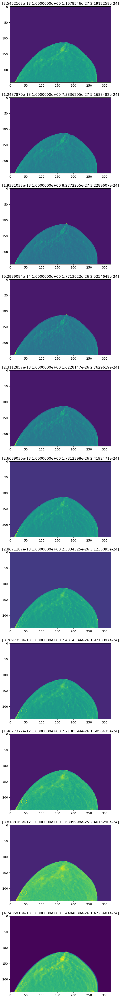

In [68]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Normal
1/1 [==============================] - 0s 31ms/step
[6.0198927e+00 6.0896588e-21 4.9801073e+00 3.3862126e-09]
Algorithm predict: Normal


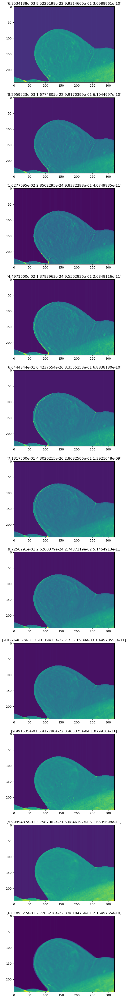

In [69]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Actionable
1/1 [==============================] - 0s 31ms/step
[2.31900299e-06 1.00370979e+01 9.62887585e-01 1.15130615e-05]
Algorithm predict: Actionable


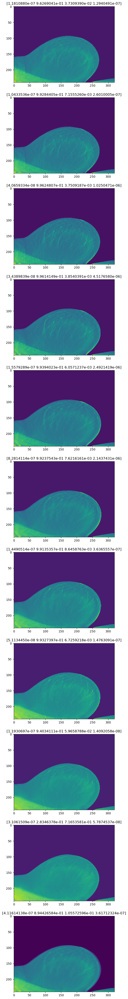

In [70]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Cancer
1/1 [==============================] - 0s 29ms/step
[1.0999976e+01 2.1549658e-11 1.1044617e-08 2.4357534e-05]
Algorithm predict: Normal


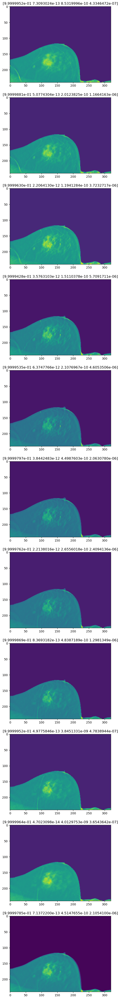

In [71]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Normal
1/1 [==============================] - 0s 32ms/step
[9.1315708e+00 5.7840192e-01 2.3746119e-10 1.2900274e+00]
Algorithm predict: Normal


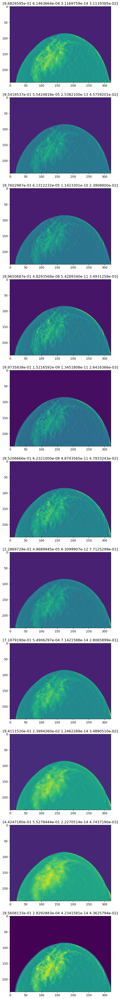

In [72]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Benign
1/1 [==============================] - 0s 30ms/step
[1.0999984e+01 1.6420290e-05 9.3161607e-29 0.0000000e+00]
Algorithm predict: Normal


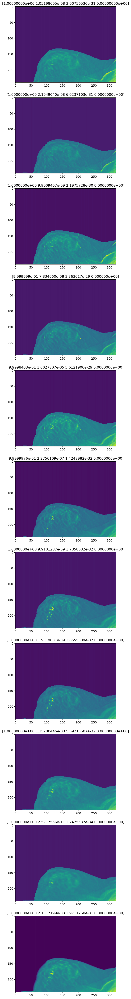

In [73]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Benign
1/1 [==============================] - 0s 31ms/step
[1.1000000e+01 1.9096479e-31 2.1525301e-13 2.9120711e-10]
Algorithm predict: Normal


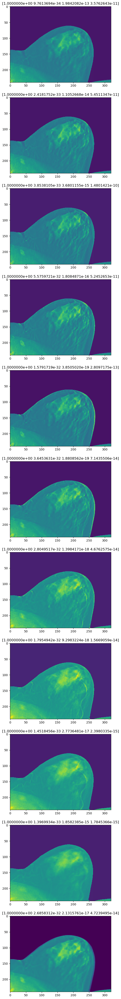

In [74]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Cancer
1/1 [==============================] - 0s 33ms/step
[1.1000000e+01 1.1485935e-20 1.1232448e-36 5.6577206e-15]
Algorithm predict: Normal


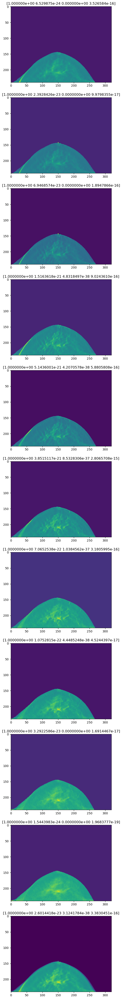

In [75]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11

Class label is: Normal
1/1 [==============================] - 0s 31ms/step
[1.1000000e+01 6.8568119e-07 1.0640134e-09 1.0962566e-20]
Algorithm predict: Normal


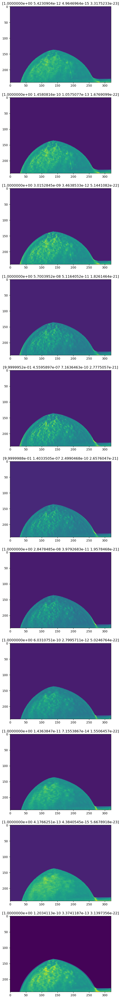

In [76]:
predict(X_test[i:i+11], y_test[i], vgg19)
i += 11